# ELLATIFI Rayane 


## Exercice 1

In [4]:
import scipy.stats as ss
from decimal import Decimal
import math as m
import numpy as np
from datetime import date,timedelta

We define a function call_bsm to compute the price of the call using the BS formula given in the paper.
Then we define the function vega which is the derivative of the BS formula with respect to the volatility. 
And finally we use the Newton scheme or method to get the numerical solution of the implicit volatility in this BS model.

In [5]:
def call_bsm (S0,K,r,T,sig):
    d1 = Decimal(m.log(S0/K)) + (r+ (sig*sig)/2)*T/(sig*Decimal(m.sqrt(T)))
    d2 = d1 - sig*Decimal(m.sqrt(T))
    price = S0*Decimal(ss.norm.cdf(np.float(d1))) \
        - K*Decimal(m.exp(-r*T))*Decimal(ss.norm.cdf(np.float(d2)))
    return (price)

In [6]:
def vega (S0,K,r,T,sig):
    d1 = Decimal(m.log(S0/K))/(sig*Decimal(m.sqrt(T))) + Decimal((r+ (sig*sig)/2)*T/(sig*Decimal(m.sqrt(T))))
    vega = S0*Decimal(ss.norm.pdf(np.float(d1)))*Decimal(m.sqrt(T))
    return(vega)

In [54]:
def imp_vol(S0, K, T, r, market):
    e = 10e-15; x0 = Decimal(1);  
    def newtons_method(S0, K, T, r, market,x0, e):
        delta = call_bsm (S0,K,r,T,x0) - market
        while delta > e:
            x0 = Decimal(x0 - (call_bsm (S0,K,r,T,x0) - market)/vega (S0,K,r,T,x0))
            delta = abs(call_bsm (S0,K,r,T,x0) - market)
        return(Decimal(x0))
    sig =  newtons_method(S0, K, T, r, market,x0 , e)   
    return(sig*100)

We set the parameters of the call and run our functions in order to get the implied volatility.

In [167]:
fromdate = date(2018,3,30)
todate = date(2018,9,21)
daygenerator = (fromdate + timedelta(x + 1) for x in range((todate - fromdate).days))
days = sum(1 for day in daygenerator if day.weekday())
T = Decimal(days)/Decimal(360)    
S0 = Decimal(109.97)
K = Decimal(100)
market = Decimal(13.725)
r = Decimal(0.0225)
iv = imp_vol(S0, K, T, r, market)
print("")
print("")
print("############################ Newton Raphson Method ####################")
print("")
print('The implied volatility from my calculation is',iv,"%")
cp_iv = call_bsm(S0,K,r,T,sig=Decimal(iv/100))
print("")
print("Market price : ", market)
print("Model price : ", cp_iv)
print("")
print("Error in obtained call price", '{:.20f}'.format(np.float(market - cp_iv)))



############################ Newton Raphson Method ####################

The implied volatility from my calculation is 28.74769495591848288387221528 %

Market price :  13.7249999999999996447286321199499070644378662109375
Model price :  13.72499999999999673631397958

Error in obtained call price 0.00000000000000290841


Now let's see how the implied volatility evolves when we fix the maturity and vary the Strike and inversely.
   

In [168]:
K=[100,110,120,130,150,160,170]
T=150

In [172]:
imp_vo=[]
for i in np.arange(7):
    imp_vo.append(imp_vol(S0, Decimal(K[i]),T, r, market))


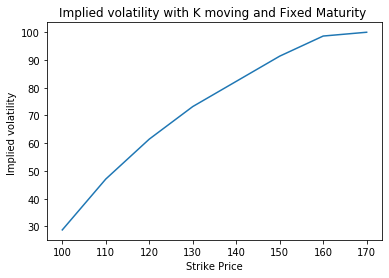

In [175]:
import matplotlib.pyplot as plt
plt.plot(K,imp_vo)
plt.title('Implied volatility with K moving and Fixed Maturity ')
plt.ylabel('Implied volatility ')
plt.xlabel('Strike Price')
plt.show()

We notice more the strike increases more the implied volatility increases. 

In [169]:
T=[30,50,100,150,200]
K=100

[100, 110, 120, 130, 150, 160, 170]

In [ ]:
imp_vo=[]
for i in np.arange(5):
    imp_vo.append(imp_vol(S0,K,T[i], r, market))


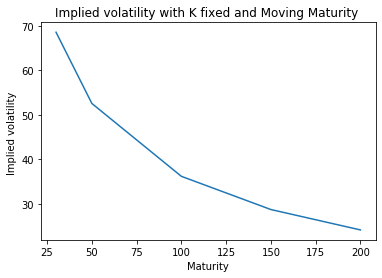

In [97]:
import matplotlib.pyplot as plt
plt.plot(T,imp_vo)
plt.title('Implied volatility with K fixed and Moving Maturity ')
plt.ylabel('Implied volatility ')
plt.xlabel('Maturity')
plt.show()

## Exercice 2 

After some computation we end with this formula called geometric asian option.
Then we implement a Monte-Carlo method to approach the price.

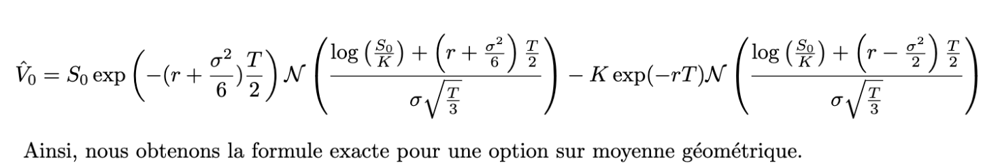

In [197]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm
import time
r = 0.1
sigma = 0.3
T = 1
K = 90
S0 = 100

In [199]:
def ExactPricing(r,T,K,S0,sigma):
    d1 = (np.log(S0/K) + (r + (sigma**2)/2)*T)/(sigma*np.sqrt(T))
    d2 = d1 - sigma*np.sqrt(T)
    return S0*norm.cdf(d1) - K * np.exp(-r*T)* norm.cdf(d2)


def geometricExactPricing(r,T,K,S0,sigma):
    d1 = (np.log(S0/K) + (r+(sigma**2)/6)*T/2)/(sigma*np.sqrt(T/3))
    d2 = (np.log(S0/K) + (r-(sigma**2)/2)*T/2)/(sigma*np.sqrt(T/3))
    return S0*np.exp(-(r + (sigma**2)/6)*T/2) * norm.cdf(d1) - K * np.exp(-r*T)* norm.cdf(d2)

################# Monte Carlo Simulation ##########

def Monte_Carlo_lognormal(iterations = 1000000, K = 110, T = 1, r = 0.1):
    lognorm = np.random.lognormal(mulog, sigmalog, iterations)
    Price = np.exp(-r*T) * np.maximum(lognorm - K, 0)
    std = np.std(Price)
    mean = np.mean(Price)
    return mean+(1.96*std/np.sqrt(iterations)), mean, mean-(1.96*std/np.sqrt(iterations))




In [225]:
## Exact Price 
geometricExactPricing(r,T,110,S0,sigma)

4.440155210400654

In [218]:
## Numerical price and confidence interval 
Monte_Carlo_lognormal(iterations = 1000000, K = 110, T = 1, r = 0.1)

(4.8669008924552, 4.848456186758041, 4.830011481060882)

In [227]:
upper,mean,lower= Monte_Carlo_lognormal(iterations = 1000000, K = 110, T = 1, r = 0.1)

In [232]:
print("Error : ", abs(mean-geometricExactPricing(r,T,110,S0,sigma)))


Error :  0.42223223962889644


## Exercice 3 

       We buy 2000 calls at $1.41 per units and 2000 puts at $1.12 per units with strike price $23 and maturity six     months.
    Current value of the stock is $22.5

In [237]:
Put_premium=1.12
Call_premium=1.41
StrategyCost=2000*Put_premium+2000*Call_premium
print("Cost of strategy : ", StrategyCost)

Cost of strategy :  5060.0


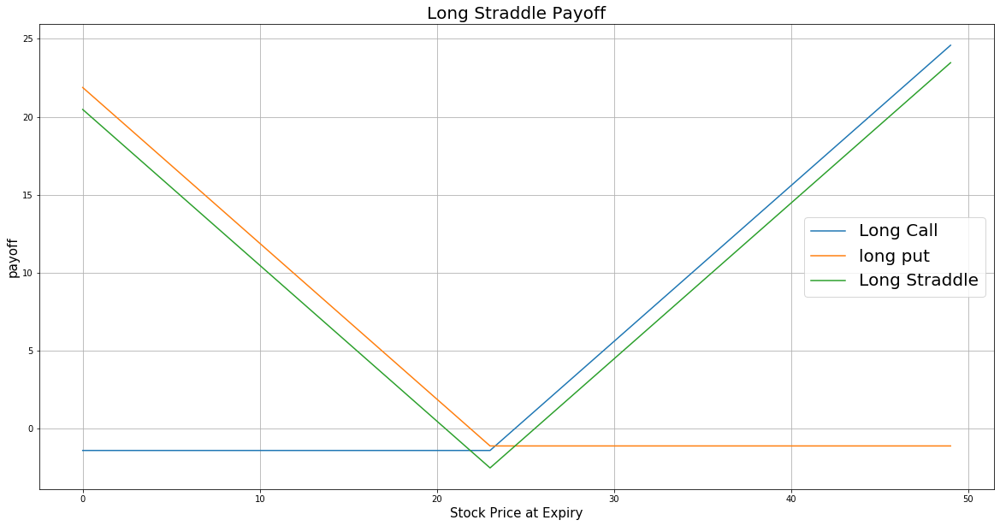

In [236]:
price = np.arange(0,50,1)
strike = 23 # strike price for both call and put
premium_call = 1.41 # premium of call option
premium_put = 1.12 # premium of put option
# payoff for the long call
payoff_long_call = [max(-premium_call, i-strike-premium_call) for i in price]
# payoff for the long put
payoff_long_put = [max(-premium_put, strike-i-premium_put) for i in price]
payoff = np.sum([payoff_long_call, payoff_long_put], axis=0)
plt.figure(figsize=(20,10))
plt.plot(price, payoff_long_call, label = 'Long Call')
plt.plot(price, payoff_long_put, label = 'long put')
plt.plot(price, payoff, label = 'Long Straddle')
plt.legend(fontsize = 20)
plt.xlabel('Stock Price at Expiry',fontsize = 15)
plt.ylabel('payoff',fontsize = 15)
plt.title('Long Straddle Payoff',fontsize = 20)
plt.grid(True)

There are three possible outcomes at expiration for the Long Straddle strategy. If the stock price is at the strike price at expiration, then both the call and the put become worthless and we loose all the investment. 
If the stock price is above the strike price at expiration, the put option expires worthless, the long call is exercised, the stock is purchased at the strike price.  If the stock price is below the strike price at expiration, the call expires worthless, the long put is exercised, the stock is sold at the strike price.

The greatest loss Tom can make happens when the stock equals the strike at the maturity, in that case the loss is all the investment so $5060.

If the value of the stock is $30 the put option expires worthless, but the call is exercised and we earn money from call options and we have to deduce both premiums in order to get the profit.

In [242]:
ST=30
K=23
Call_Payoff=max(ST-K,0)
Put_Payoff=max(K-ST,0)
Profit=2000*(Put_Payoff-Put_premium)+2000*(Call_Payoff-Call_premium)
print("Profit is : ",Profit)

Profit is :  8940.0


## Exercice 4

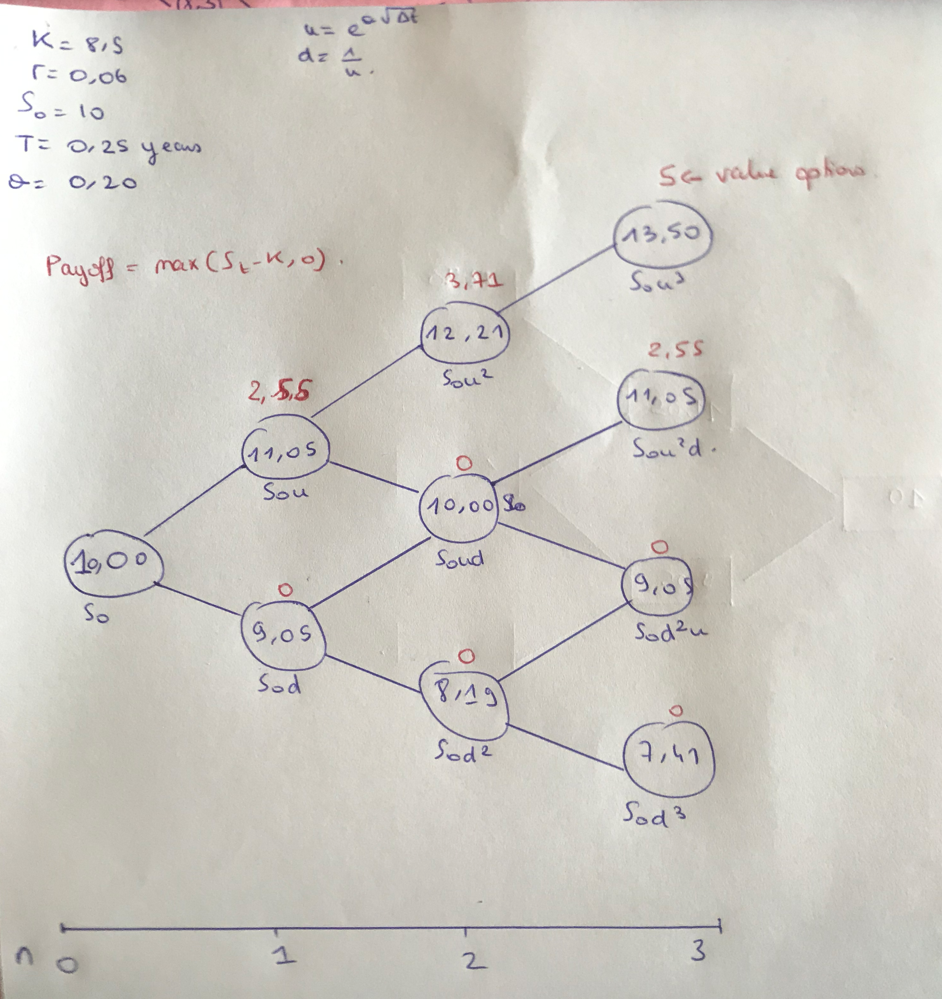